<div align="center">
      <h1>Introduction to Neural Networks</h1>
      <hr>
</div>

## Learning Objectives

In this assignment, you will dive into the fundamental concepts of neural networks, focusing specifically on a neural network with two hidden layers. This architecture is a great starting point to understand how more complex deep learning models are structured and function. Our hands-on approach will guide you through the process of applying neural networks to the intriguing spiral dataset a visually appealing and challenging problem that showcases the power of neural networks in pattern recognition.

## Exploring Neural Networks

Through this practical exercise, you will gain a comprehensive understanding of how neural networks operate and learn from data. Here are the key areas we will explore:

- **Applying Neural Networks to the Spiral Dataset:** By using a neural network to classify the spiral dataset, you’ll be able to visualize how the model performs on a complex, nonlinear dataset. This exercise will provide you with a tangible example of how neural networks can identify intricate patterns and relationships that simpler models might struggle with.
- **Understanding Activation Functions:** We'll experiment with various activation functions, such as ReLU (Rectified Linear Unit), sigmoid, and tanh, within the context of the neural network architecture. You’ll learn how these activation functions play a crucial role in determining the network’s ability to model complex patterns, and how their choice impacts the network’s performance and learning process.

By the end of this assignment, you will have a solid grasp of how neural networks function, and you’ll be better equipped to understand the role of key components such as activation functions and hidden layers in building effective machine learning models.

In [1]:
import matplotlib.pyplot as plt

%matplotlib inline
plt.rcParams['image.interpolation'] = 'nearest'

%load_ext autoreload
%autoreload 2

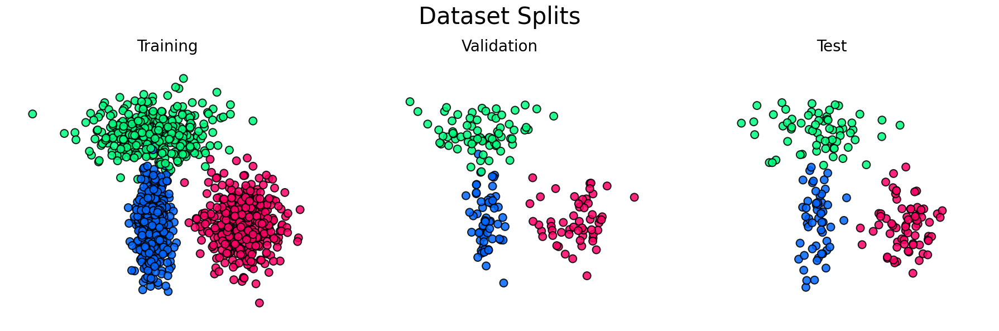

---------------- Training data ----------------
X_train shape: torch.Size([1125, 2]), y_train shape: torch.Size([1125])

---------------- Validation data ----------------
X_val shape: torch.Size([187, 2]), y_val shape: torch.Size([187])

---------------- Testing data ----------------
X_test shape: torch.Size([188, 2]), y_test shape: torch.Size([188])

---------------- Dataset info ----------------
Number of classes: 3
Number of features: 2
Number of samples in dataset: 1500
Number of samples in training set: 1125, which is 75.00% of the dataset
Number of samples in validation set: 187, which is 12.47% of the dataset
Number of samples in testing set: 188, which is 12.53% of the dataset


In [2]:
import os
import torch
import numpy as np

from utils import Data2DVisualizer, dataset_stats

notebook_dir = os.getcwd()
dataset_path = os.path.join(notebook_dir, 'data', 'datasets', 'linearly_separable.npz')

# Load the dataset
dataset = np.load(dataset_path)

X_train = torch.from_numpy(dataset['X_train']).float()
y_train = torch.from_numpy(dataset['y_train']).long()

X_val = torch.from_numpy(dataset['X_val']).float()
y_val = torch.from_numpy(dataset['y_val']).long()

X_test = torch.from_numpy(dataset['X_test']).float()
y_test = torch.from_numpy(dataset['y_test']).long()

vis = Data2DVisualizer((X_train, y_train), (X_val, y_val), (X_test, y_test))
vis.show_dataset()

num_features, num_classes, num_samples = dataset_stats(X_train, y_train, X_val, y_val, X_test, y_test, verbose=True)

## MLP Assignments

First read the materials provided [MLP Materials](https://urob-ctu.github.io/docs/docs/classification/mlp.html) and then procees to the assignments in the `assignments/mlp_classifier.py` file. After that return to this notebook and run the following cells to train and evaluate your model.

In [3]:
# Define the dimensions of the hidden layers
hidden_dim_1 = 100
hidden_dim_2 = 2

### ReLU Activation Function

Training: 100%|██████████| 10000/10000 [00:09<00:00, 1018.01it/s]


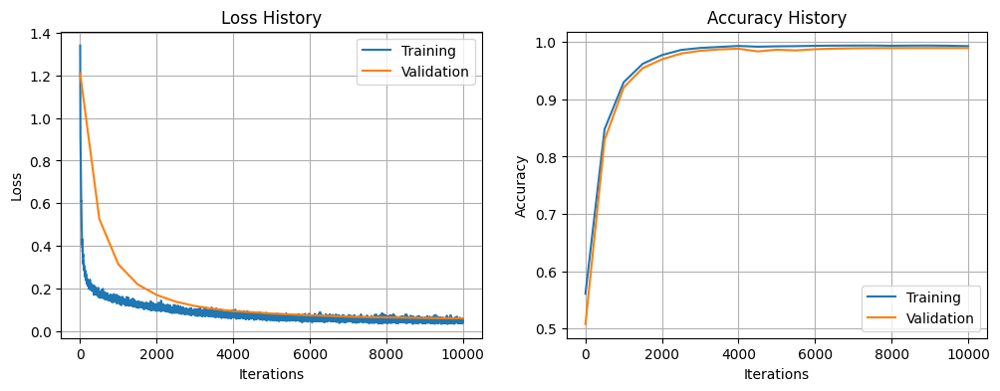

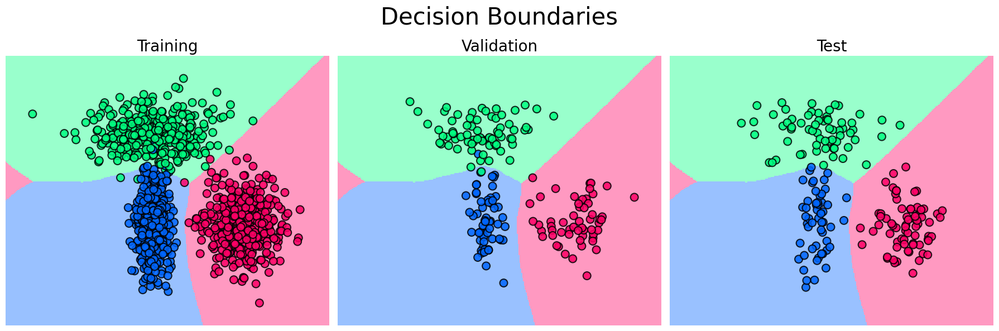

In [4]:
import torch

from utils import plot_training
from assignments.mlp_classifier import MLPClassifier

torch.random.manual_seed(69)

# Train the MLP with ReLU activation function
mlp_relu = MLPClassifier(num_features, 
                         hidden_dim_1, 
                         hidden_dim_2, 
                         num_classes, 
                         reg=1e-3,
                         learning_rate=0.1, 
                         batch_size=200, 
                         num_iters=10000)
relu_loss_history, relu_acc_history = mlp_relu.train(X_train, y_train, X_val, y_val)

# Plot the training loss and accuracy and visualize the decision boundaries
plot_training(relu_loss_history, relu_acc_history, ema=True, alpha=0.5)
vis.show_decision_boundaries(mlp_relu, h=0.01)

In [5]:
vis.show_decision_functions(mlp_relu)

### Hyperbolic Tangent Activation Function

Training:   0%|          | 36/20000 [00:00<00:56, 354.29it/s]

Training: 100%|██████████| 20000/20000 [00:18<00:00, 1064.08it/s]


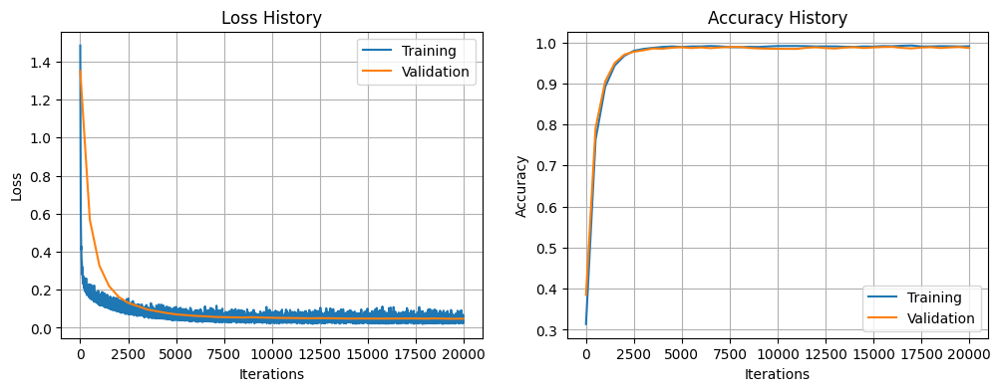

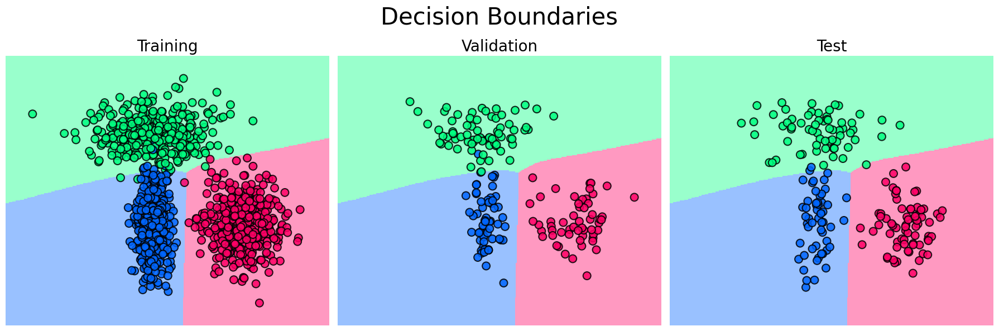

In [6]:
import torch

from utils import plot_training
from assignments import MLPClassifier

torch.random.manual_seed(69)

# Train the MLP with Hyperbolic Tangent as an activation function
mlp_tanh = MLPClassifier(num_features, 
                         hidden_dim_1, 
                         hidden_dim_2, 
                         num_classes, 
                         reg=1e-3,
                         learning_rate=1e-1, 
                         batch_size=100, 
                         num_iters=20000, 
                         activation='tanh')
tanh_loss_history, tanh_acc_history = mlp_tanh.train(X_train, y_train, X_val, y_val)

# Plot the training loss and accuracy and visualize the decision boundaries
plot_training(tanh_loss_history, tanh_acc_history, ema=True, alpha=0.5)
vis.show_decision_boundaries(mlp_tanh, h=0.01)

In [7]:
vis.show_decision_functions(mlp_tanh)

### Sigmoid Activation Function

Training:   0%|          | 0/30000 [00:00<?, ?it/s]

Training: 100%|██████████| 30000/30000 [00:28<00:00, 1054.58it/s]


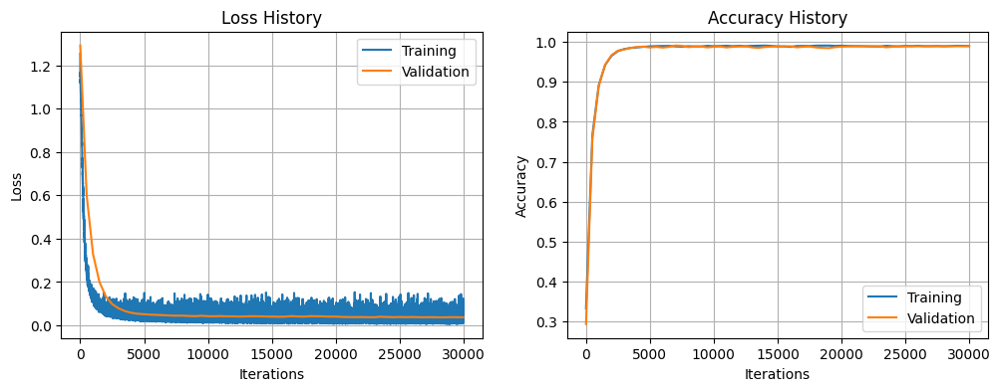

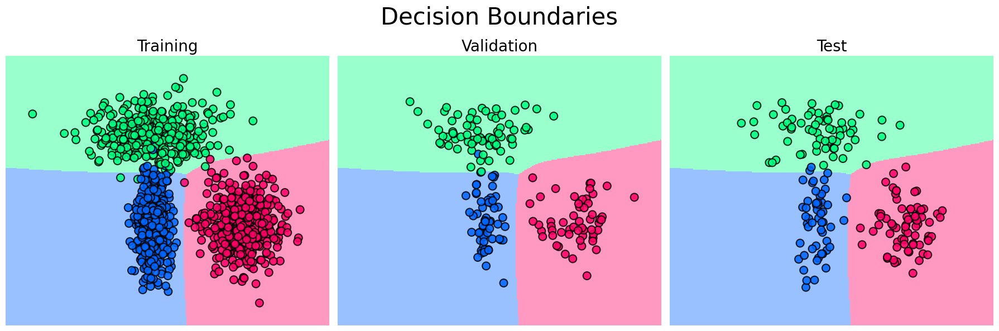

In [8]:
import torch

from utils import plot_training
from assignments import MLPClassifier

torch.random.manual_seed(69)

# Train the MLP with Sigmoid as an activation function
mlp_sigmoid = MLPClassifier(num_features, 
                         hidden_dim_1, 
                         hidden_dim_2, 
                         num_classes, 
                         reg=1e-6,
                         learning_rate=1e-1, 
                         batch_size=50, 
                         num_iters=30000, 
                         activation='sigmoid')

sigmoid_loss_history, sigmoid_acc_history = mlp_sigmoid.train(X_train, y_train, X_val, y_val)

# Plot the training loss and accuracy and visualize the decision boundaries
plot_training(sigmoid_loss_history, sigmoid_acc_history, ema=True, alpha=0.5)
vis.show_decision_boundaries(mlp_sigmoid, h=0.01)

In [9]:
vis.show_decision_functions(mlp_sigmoid)